In [ ]:
import pandas as pd
import json

df = pd.read_csv("INvideos.csv", encoding='latin-1')
with open("IN_category_id.json", 'r') as f:
    category_data = json.load(f)

category_mapping = {}
for item in category_data['items']:
    category_mapping[int(item['id'])] = item['snippet']['title']

df['category_name'] = df['category_id'].map(category_mapping)

df['description'] = df['description'].fillna("No Description")
df['tags'] = df['tags'].fillna("No Tags")

df = df.drop_duplicates()
df = df.dropna(subset=['title', 'channel_title'])

df['trending_date'] = pd.to_datetime(df['trending_date'], format='%y.%d.%m', errors='coerce')
df['publish_time'] = pd.to_datetime(df['publish_time'], errors='coerce')

df['publish_day'] = df['publish_time'].dt.day_name()
df['publish_hour'] = df['publish_time'].dt.hour

df = df.reset_index(drop=True)

print("✅ Data cleaned successfully!")
print("Rows:", df.shape[0], " Columns:", df.shape[1])
print("\nColumns:", list(df.columns))
print("\nSample Data:\n", df.head())


In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set(style="whitegrid")


In [3]:
df[['views','likes','dislikes','comment_count']].describe()


,views,likes,dislikes,comment_count
count,3.308900e+04,3.308900e+04,3.308900e+04,33089.000000
mean,9.963425e+05,2.558762e+04,1.576535e+03,2524.777660
std,3.148111e+06,9.647320e+04,1.689573e+04,14769.825108
min,4.024000e+03,0.000000e+00,0.000000e+00,0.000000
25%,1.127190e+05,7.870000e+02,9.800000e+01,72.000000
50%,2.750270e+05,2.757000e+03,2.890000e+02,298.000000
75%,7.320220e+05,1.201100e+04,9.320000e+02,1169.000000
max,1.254322e+08,2.912710e+06,1.545017e+06,827755.000000


In [4]:
df['category_name'].value_counts()


category_name
Entertainment           14764
News & Politics          4709
Music                    3292
Comedy                   2967
People & Blogs           2367
Film & Animation         1463
Education                1166
Howto & Style             801
Sports                    646
Science & Technology      517
Shows                     149
Autos & Vehicles           69
Gaming                     55
Movies                     10
Travel & Events             8
Pets & Animals              3
Name: count, dtype: int64

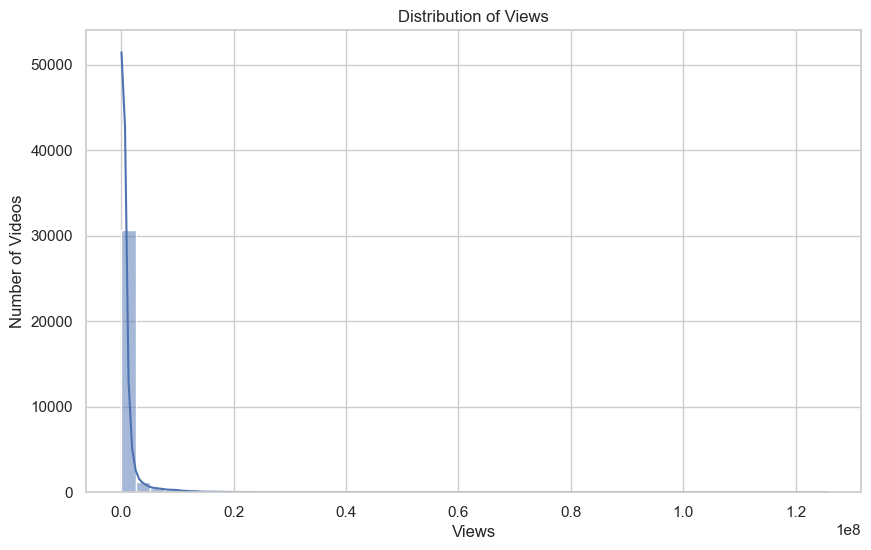

In [5]:
plt.figure(figsize=(10,6))
sns.histplot(df['views'], bins=50, kde=True)
plt.title("Distribution of Views")
plt.xlabel("Views")
plt.ylabel("Number of Videos")
plt.show()


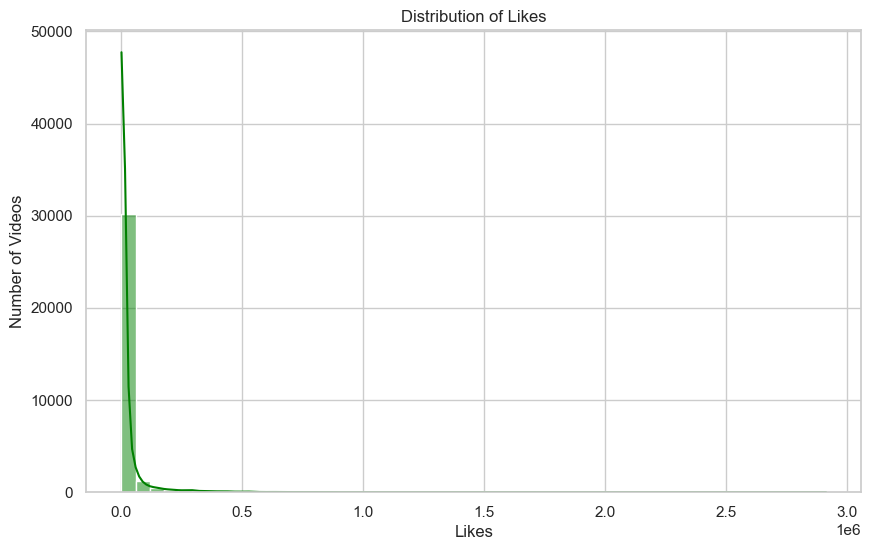

In [6]:
plt.figure(figsize=(10,6))
sns.histplot(df['likes'], bins=50, kde=True, color='green')
plt.title("Distribution of Likes")
plt.xlabel("Likes")
plt.ylabel("Number of Videos")
plt.show()


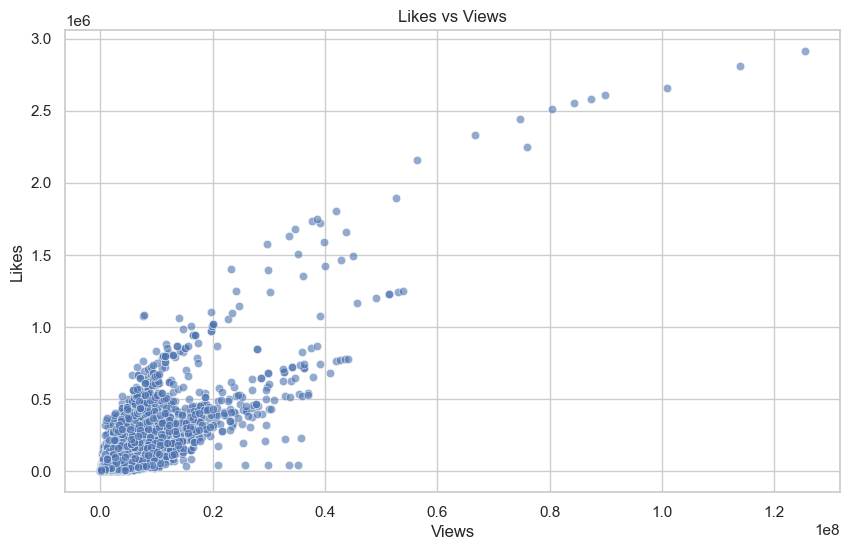

In [7]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='views', y='likes', data=df, alpha=0.6)
plt.title("Likes vs Views")
plt.xlabel("Views")
plt.ylabel("Likes")
plt.show()


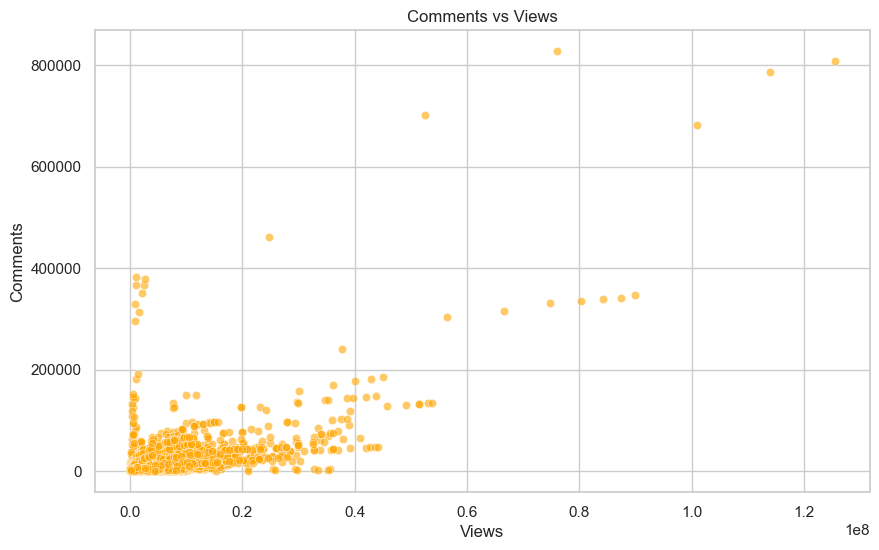

In [8]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='views', y='comment_count', data=df, alpha=0.6, color='orange')
plt.title("Comments vs Views")
plt.xlabel("Views")
plt.ylabel("Comments")
plt.show()


C:\Users\vmani\AppData\Local\Temp\ipykernel_15536\1897154798.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_views.index, y=category_views.values, palette='viridis')


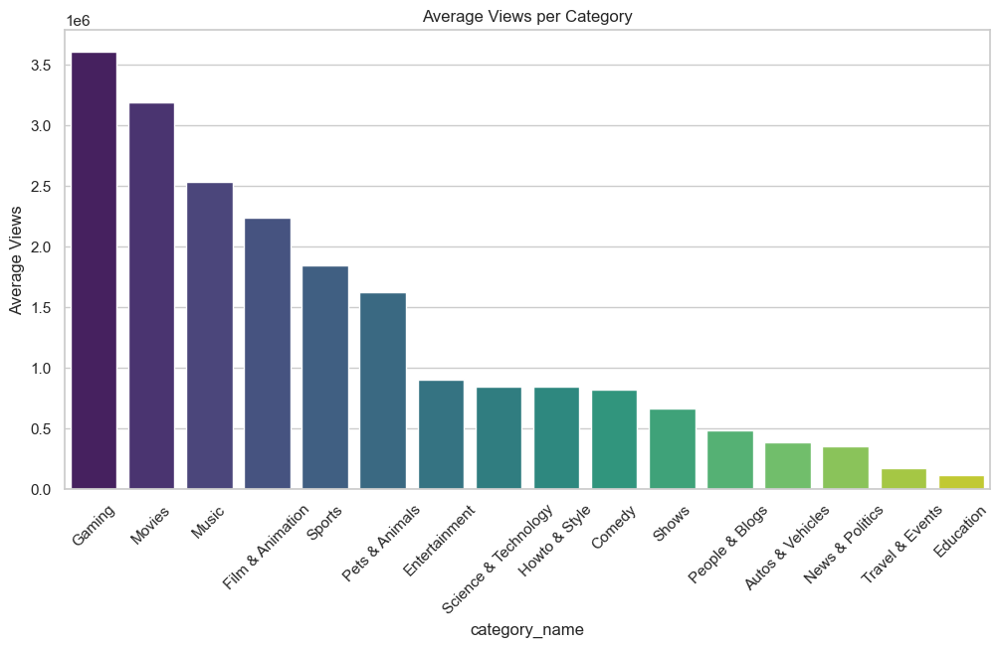

In [9]:
category_views = df.groupby('category_name')['views'].mean().sort_values(ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(x=category_views.index, y=category_views.values, palette='viridis')
plt.title("Average Views per Category")
plt.xticks(rotation=45)
plt.ylabel("Average Views")
plt.show()


C:\Users\vmani\AppData\Local\Temp\ipykernel_15536\2444619614.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_likes.index, y=category_likes.values, palette='coolwarm')


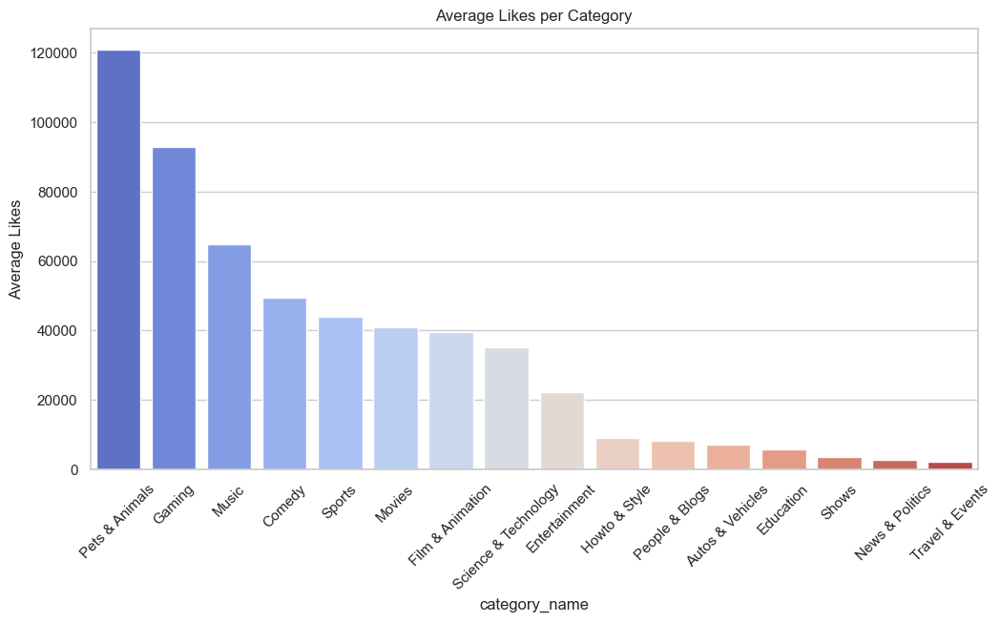

In [10]:
category_likes = df.groupby('category_name')['likes'].mean().sort_values(ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(x=category_likes.index, y=category_likes.values, palette='coolwarm')
plt.title("Average Likes per Category")
plt.xticks(rotation=45)
plt.ylabel("Average Likes")
plt.show()


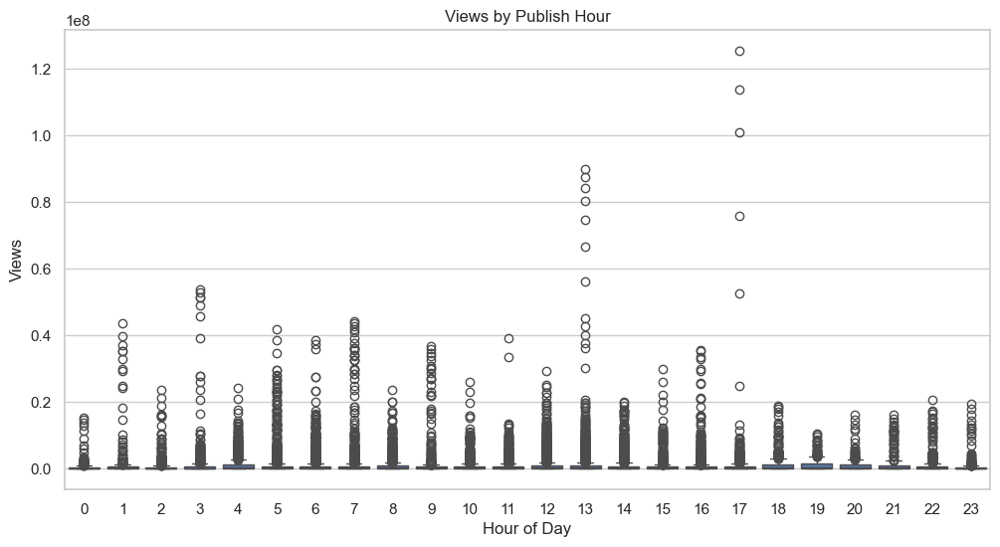

In [11]:
plt.figure(figsize=(12,6))
sns.boxplot(x='publish_hour', y='views', data=df)
plt.title("Views by Publish Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Views")
plt.show()


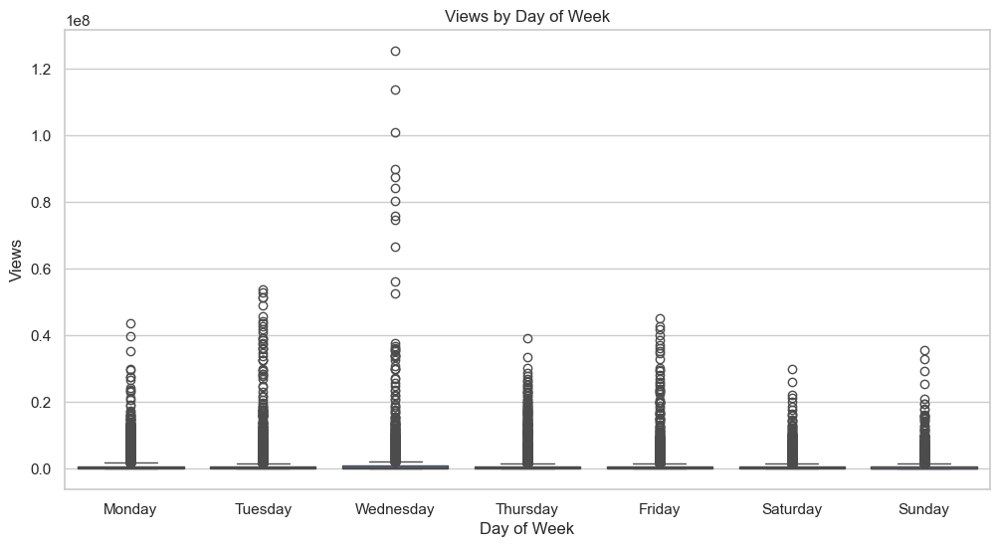

In [12]:
plt.figure(figsize=(12,6))
sns.boxplot(x='publish_day', y='views', data=df, order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.title("Views by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Views")
plt.show()


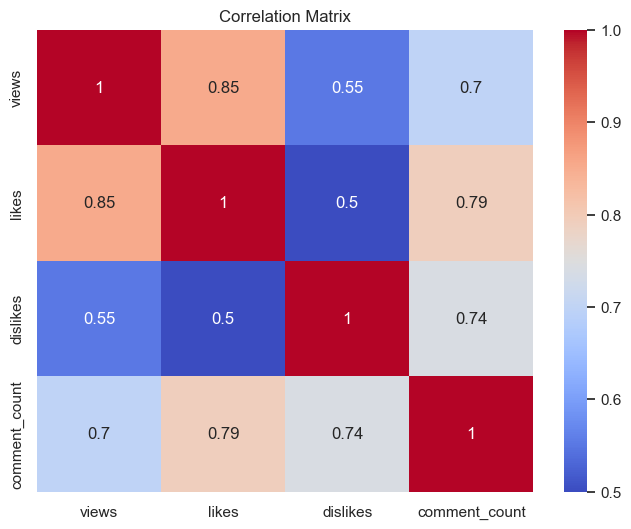

In [13]:
plt.figure(figsize=(8,6))
corr = df[['views','likes','dislikes','comment_count']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()


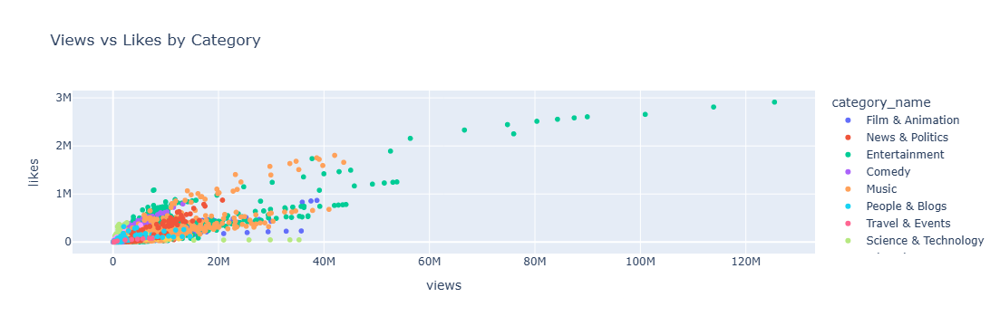

In [14]:
fig = px.scatter(df, x='views', y='likes', color='category_name',
                 hover_data=['title','channel_title'], title="Views vs Likes by Category")
fig.show()


In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [16]:
features = df[['views','likes','dislikes','comment_count']]

features.head()


,views,likes,dislikes,comment_count
0,1096327,33966,798,882
1,590101,735,904,0
2,473988,2011,243,149
3,1242680,70353,1624,2684
4,464015,492,293,66


In [17]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)


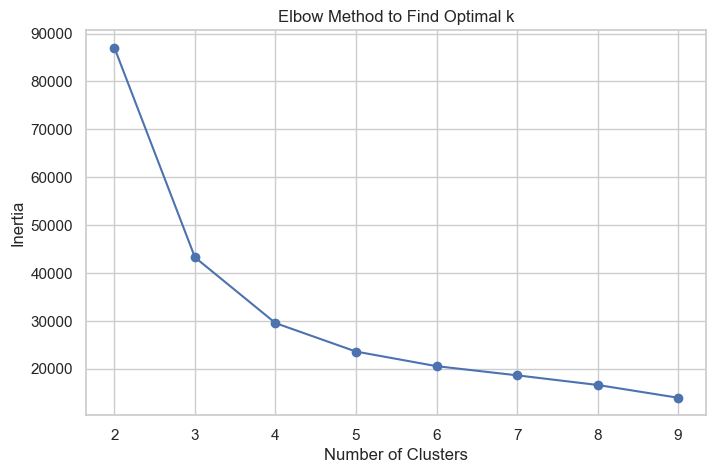

In [18]:
inertia = []

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

# Plot Elbow curve
plt.figure(figsize=(8,5))
plt.plot(range(2, 10), inertia, marker='o')
plt.title("Elbow Method to Find Optimal k")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()


In [19]:
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(scaled_features)

df['cluster'].value_counts()


cluster
0    32336
1      748
2        5
Name: count, dtype: int64

In [20]:
score = silhouette_score(scaled_features, df['cluster'])
print("Silhouette Score:", score)


Silhouette Score: 0.9208229118889676


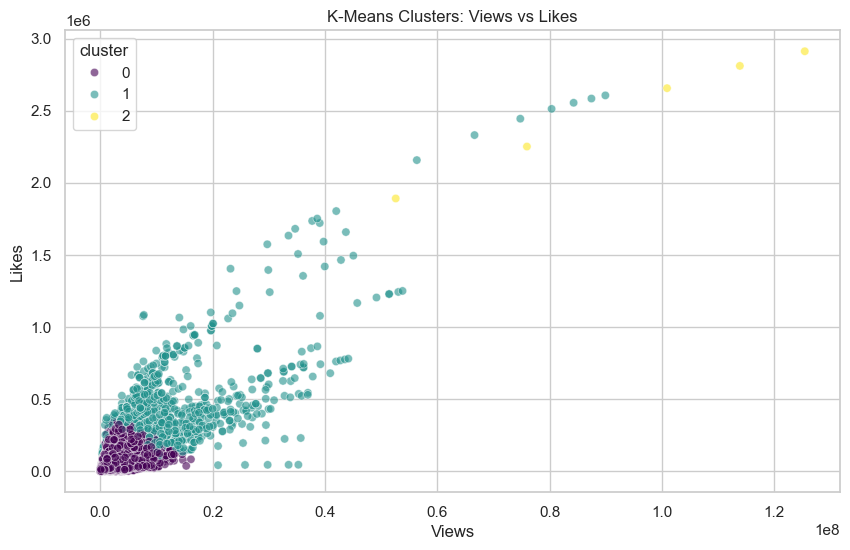

In [21]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='views', y='likes', hue='cluster', data=df, palette='viridis', alpha=0.6)
plt.title("K-Means Clusters: Views vs Likes")
plt.xlabel("Views")
plt.ylabel("Likes")
plt.show()


In [22]:
cluster_summary = df.groupby('cluster')[['views','likes','dislikes','comment_count']].mean()
print(cluster_summary)


                views         likes      dislikes  comment_count
cluster                                                         
0        6.712359e+05  1.475053e+04  8.964893e+02    1319.962024
1        1.443060e+07  4.775017e+05  2.245358e+04   49534.645722
2        9.376024e+07  2.504845e+06  1.276363e+06  761632.200000


In [23]:
cluster_category = df.groupby(['cluster','category_name']).size().unstack(fill_value=0)
print(cluster_category)


category_name  Autos & Vehicles  Comedy  Education  Entertainment  \
cluster                                                             
0                            69    2898       1165          14448   
1                             0      69          1            311   
2                             0       0          0              5   

category_name  Film & Animation  Gaming  Howto & Style  Movies  Music  \
cluster                                                                 
0                          1379      51            801      10   3082   
1                            84       4              0       0    210   
2                             0       0              0       0      0   

category_name  News & Politics  People & Blogs  Pets & Animals  \
cluster                                                          
0                         4705            2367               3   
1                            4               0               0   
2                       